<a href="https://colab.research.google.com/github/SAMashiyane/bullet/blob/main/Bullet_Test_advance_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Wed Dec 27 17:30:49 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P8              13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 30.9 MB/s eta 0:00:00


In [3]:
import timm
from pprint import pprint
model_names = timm.list_models(pretrained=True)
# pprint(model_names)

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import glob
import cv2
import shutil
import gc
import os
import time
import datetime
import warnings
import random

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader,Dataset, Subset
import torchvision.models as models
from torchvision.models import resnet18, resnet34 ,resnet50

from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, GroupKFold, KFold

# from efficientnet_pytorch import EfficientNet ---> for use this   *pip install efficientnet-pytorch*


In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch
use_gpu = torch.cuda.is_available()

In [6]:
use_gpu

True

In [7]:
# # DATA_DIR = r"C:\Users\Salio\Desktop\Bruise_data\bruise-dating-paper-dataset-main\datasets"
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [13]:
# trn_dir = "/content/gdrive/MyDrive/Bruise_datasets/train"
# val_dir = "/content/gdrive/MyDrive/Bruise_datasets/validation"
trn_dir = "/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet"
val_dir = "/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet"


In [14]:
trn_fnames = glob.glob(f'{trn_dir}/*/*.png')
trn_fnames[:5]

['/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet/outlet/Screenshot 1402-09-17 at 17.04.19.png',
 '/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet/outlet/Screenshot 1402-09-17 at 17.04.29.png',
 '/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet/outlet/Screenshot 1402-09-17 at 17.04.38.png',
 '/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet/outlet/Screenshot 1402-09-17 at 17.05.29.png',
 '/content/gdrive/MyDrive/bullet/bullet_total/atlas_bullet/outlet/Screenshot 1402-09-21 at 18.32.50.png']

In [17]:
val_fnames = glob.glob(f'{val_dir}/*/*.jpg')
val_fnames[:5]

['/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet/inlet/2.jpg',
 '/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet/inlet/3.jpg',
 '/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet/inlet/5.jpg',
 '/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet/inlet/6.jpg',
 '/content/gdrive/MyDrive/bullet/bullet_total/salon_bullet/inlet/7.jpg']

(313, 525, 3)


numpy.ndarray

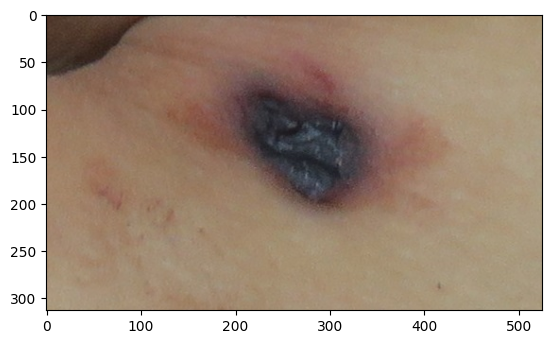

In [19]:
img = plt.imread(val_fnames[12])
plt.imshow(img);
print(img.shape)
type(img)

# *add hair to bruise image for train*
# AdvancedHairAugmentation

In [ ]:
!pip install opencv-contrib-python

(413, 401, 3)


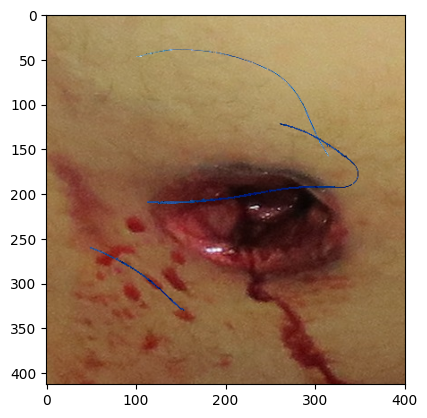

In [ ]:
import torch
import torchvision
import torch.nn.functional as F
import torch.nn as nn
# import torchtoolbox.transform as transforms
# from cv2.cv2 import CV_32F
from cv2 import *
from torch.utils.data import Dataset, DataLoader, Subset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, GroupKFold, KFold
import pandas as pd
import numpy as np
import gc
import os
import cv2
import time
import datetime
import warnings
import random
import matplotlib.pyplot as plt


# import seaborn as sns


class AdvancedHairAugmentation_sample:
    def __init__(self, hairs: int = 4, hairs_folder: str = ""):
        self.hairs = hairs
        self.hairs_folder = hairs_folder

    def __call__(self, img):
        n_hairs = random.randint(0, self.hairs)
        # n_hairs =3
        if not n_hairs:
            return img

        height, width, _ = img.shape  # target image width and height
        # print(img.shape)
        # img = cv2.cvtColor(img, cv2.COLOR_BGRA2BGR)
        # print(img.shape)
        hair_images = [im for im in os.listdir(self.hairs_folder) if 'png' in im]
        # print(hair_images)
        # print(n_hairs)
        n = 0
        for _ in range(n_hairs):
          hair = cv2.imread(os.path.join(self.hairs_folder, random.choice(hair_images)))
          # print("))))))))((((((((((((")

          # print(hair)
          # window_name = 'image'
          # cv2.imshow(window_name, hair)
          # cv2.waitKey(0)
          # cv2.destroyAllWindows()

          hair = cv2.flip(hair, random.choice([-1, 0, 1]))
          hair = cv2.rotate(hair, random.choice([0, 1, 2]))
          # window_name = 'image'
          # cv2.imshow(window_name, hair)
          # cv2.waitKey(0)
          # cv2.destroyAllWindows()
          h_height, h_width, _ = hair.shape # hair image width and height
          # print(img.shape[0])
          # print(hair.shape[0])
          roi_ho = random.randint(0, abs(img.shape[0] - hair.shape[0]))
          roi_wo = random.randint(0, abs(img.shape[1] - hair.shape[1]))
          # print(type(img))
          if img.shape[0] < hair.shape[0] or img.shape[1] < hair.shape[1]:
             return img
          roi = img[roi_ho:roi_ho + h_height, roi_wo:roi_wo + h_width]
          roi = roi.astype(np.uint8)
          # print(type(roi))
          img2gray = cv2.cvtColor(hair, cv2.COLOR_BGR2GRAY)
          ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
          mask_inv = cv2.bitwise_not(mask)
          mask_inv = mask_inv.astype(np.uint8)
          img_bg = cv2.bitwise_and(roi, roi, mask=mask_inv)
          # print(type(img_bg))
          hair_fg = cv2.bitwise_and(hair, hair, mask=mask)
          # print(type(hair_fg))
          dst = cv2.add(img_bg, hair_fg)
          # print(dst.shape)
          # dst =hair_fg
          # print(type(dst))
          # print(dst.shape)
          # print(img.shape)
          # print("#####################")

          # print(roi_ho)
          # print(roi_ho + h_height)
          # print(roi_wo)
          # print(roi_wo + h_width)
          img = img.copy()
          img[roi_ho:roi_ho + h_height, roi_wo:roi_wo + h_width] = dst
          # img.flags.writeable = True

          # imgc[169:384,278:398] = dst

          # img=dst
        return img

    def __repr__(self):

       return f'{self.__class__.__name__}(hairs={self.hairs}, hairs_folder="{self.hairs_folder}")'


Ad_Hair_Agu = AdvancedHairAugmentation_sample(hairs=4, hairs_folder=r"/content/gdrive/MyDrive/Bruise_datasets/hairs_folder/")

img = plt.imread(r'/content/gdrive/MyDrive/bullet/train/inlet/10.jpg')
# print(repr(Ad_Hair_Agu))
print(img.shape)
Ad_Hair_Agu = Ad_Hair_Agu(img=img)
plt.imshow(Ad_Hair_Agu)



this work by albuminations

In [ ]:
import torch
import torchvision
import torch.nn.functional as F
import torch.nn as nn
# import torchtoolbox.transform as transforms
# from cv2.cv2 import CV_32F
from cv2 import *
from torch.utils.data import Dataset, DataLoader, Subset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold, GroupKFold, KFold
import pandas as pd
import numpy as np
import gc
import os
import cv2
import time
import datetime
import warnings
import random
import matplotlib.pyplot as plt

In [ ]:

from albumentations.core.transforms_interface import ImageOnlyTransform
class AdvancedHairAugmentation(ImageOnlyTransform):
  def __init__(self, hairs: int = 4, hairs_folder: str = "", always_apply=False, p=0.5):
      super(AdvancedHairAugmentation, self).__init__(always_apply=always_apply, p=p)
      self.hairs = hairs
      self.hairs_folder = hairs_folder

  def apply(self, image, **params):
      n_hairs = random.randint(0, self.hairs)

      if not n_hairs:
          return image

      height, width, _ = image.shape  # target image width and height
      hair_images = [im for im in os.listdir(self.hairs_folder) if 'png' in im]

      for _ in range(n_hairs):
          hair = cv2.imread(os.path.join(self.hairs_folder, random.choice(hair_images)))
          hair = cv2.cvtColor(hair, cv2.COLOR_BGR2RGB)
          hair = cv2.flip(hair, random.choice([-1, 0, 1]))
          hair = cv2.rotate(hair, random.choice([0, 1, 2]))

          h_height, h_width, _ = hair.shape  # hair image width and height
          roi_ho = random.randint(0, abs(image.shape[0] - hair.shape[0]))
          roi_wo = random.randint(0, abs(image.shape[1] - hair.shape[1]))
          if image.shape[0] < hair.shape[0] or image.shape[1] < hair.shape[1]:
             return image
          roi = image[roi_ho:roi_ho + h_height, roi_wo:roi_wo + h_width]
          roi = roi.astype(np.uint8)
          img2gray = cv2.cvtColor(hair, cv2.COLOR_BGR2GRAY)
          ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
          mask_inv = cv2.bitwise_not(mask)
          mask_inv = mask_inv.astype(np.uint8)
          img_bg = cv2.bitwise_and(roi, roi, mask=mask_inv)
          hair_fg = cv2.bitwise_and(hair, hair, mask=mask)

          dst = cv2.add(img_bg, hair_fg)
          image[roi_ho:roi_ho + h_height, roi_wo:roi_wo + h_width] = dst
      return image

  def get_params_dependent_on_targets(self, params):
      return {}

  @property
  def targets_as_params(self):
      return ["image"]

  def get_transform_init_args_names(self):
      return ()


(406, 616, 4)


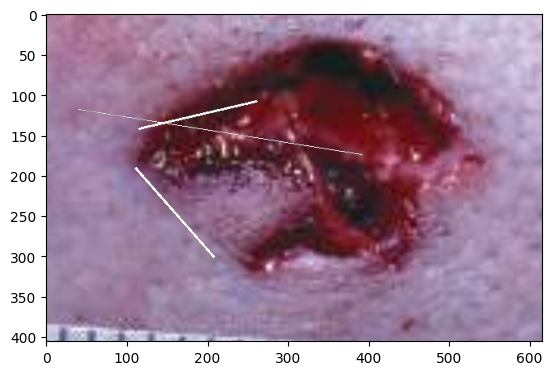

In [ ]:
class DrawHair_sample:
    """
    Draw a random number of pseudo hairs

    Args:
        hairs (int): maximum number of hairs to draw
        width (tuple): possible width of the hair in pixels
    """

    def __init__(self, hairs:int = 4, width:tuple = (1, 2)):
        self.hairs = hairs
        self.width = width

    def __call__(self, img):
        """
        Args:
            img (PIL Image): Image to draw hairs on.

        Returns:
            PIL Image: Image with drawn hairs.
        """
        if not self.hairs:
            return img

        width, height, _ = img.shape

        for _ in range(random.randint(0, self.hairs)):
            # The origin point of the line will always be at the top half of the image
            origin = (random.randint(0, width), random.randint(0, height // 2))
            # The end of the line
            end = (random.randint(0, width), random.randint(0, height))
            color = (0, 0, 0)  # color of the hair. Black.
            cv2.line(img, origin, end, color, random.randint(self.width[0], self.width[1]))

        return img
    def __repr__(self):
        return f'{self.__class__.__name__}(hairs={self.hairs}, width={self.width})'
instan = DrawHair_sample()
print()
img_n = plt.imread(trn_fnames[10])
pic = instan(img_n)
print(img_n.shape)
plt.imshow(pic)


In [ ]:
# class DrawHair_sample:
class DrawHair(ImageOnlyTransform):

    """
    Draw a random number of pseudo hairs

    Args:
        hairs (int): maximum number of hairs to draw
        width (tuple): possible width of the hair in pixels
    """

    def __init__(self, hairs:int = 4, width:tuple = (1, 2),always_apply=False, p=0.5):
        super(DrawHair, self).__init__(always_apply=always_apply, p=p)
        self.hairs = hairs
        self.width = width

    def apply(self, image,**params):
        """
        Args:
            img (PIL Image): Image to draw hairs on.

        Returns:
            PIL Image: Image with drawn hairs.
        """
        if not self.hairs:
            return image

        width, height, _ = image.shape

        for _ in range(random.randint(0, self.hairs)):
            # The origin point of the line will always be at the top half of the image
            origin = (random.randint(0, width), random.randint(0, height // 2))
            # The end of the line
            end = (random.randint(0, width), random.randint(0, height))
            color = (0, 0, 0)  # color of the hair. Black.
            cv2.line(image, origin, end, color, random.randint(self.width[0], self.width[1]))

        return image
    def get_params_dependent_on_targets(self, params):
      return {}
    @property
    def targets_as_params(self):
      return ["image"]

    def get_transform_init_args_names(self):
       return ()

In [ ]:
!pip install albumentations==0.4.6

In [ ]:
# ---------------------------------------------- define Imgae filepath train   ----------------------------------
dataset_directory = '/content/gdrive/MyDrive/bullet/bullet_total'
root_directory_train = os.path.join(dataset_directory, "atlas_bullet")
# -------------------------------------------------------------------------------------------
inlet_directory_train = os.path.join(root_directory_train, "inlet")
outlet_directory_train = os.path.join(root_directory_train, "outlet")
# ------------------------------------------------------------------------------------------
inlet_images_filepaths_train = sorted([os.path.join(inlet_directory_train, f) for f in os.listdir(inlet_directory_train)])
oulet_directory_images_filepaths_train = sorted([os.path.join(outlet_directory_train, f) for f in os.listdir(outlet_directory_train)])
# ----------------------------------------------------------------------------------------------------------------------------------------
images_filepaths_train = [*inlet_images_filepaths_train, *oulet_directory_images_filepaths_train]
correct_images_filepaths_train = [i for i in images_filepaths_train if cv2.imread(i) is not None]
# correct_images_filepaths
random.seed(42)
random.shuffle(correct_images_filepaths_train)
#.  ------ >>>>>>>>>>.        correct_images_filepaths_train
print(len(correct_images_filepaths_train))

319


In [ ]:
# ---------------------------------------------- define Imgae filepath Validation  ----------------------------------
dataset_directory = '/content/gdrive/MyDrive/bullet/bullet_total'
root_directory_validation = os.path.join(dataset_directory, "salon_bullet")
# -------------------------------------------------------------------------------------------
inlet_directory_validation = os.path.join(root_directory_validation, "inlet")
outlet_directory_validation = os.path.join(root_directory_validation, "outlet")
# ------------------------------------------------------------------------------------------
inlet_images_filepaths_validation = sorted([os.path.join(inlet_directory_validation, f) for f in os.listdir(inlet_directory_validation)])
oulet_directory_images_filepaths_validation = sorted([os.path.join(outlet_directory_validation, f) for f in os.listdir(outlet_directory_validation)])
# ----------------------------------------------------------------------------------------------------------------------------------------
images_filepaths_validation = [*inlet_images_filepaths_validation, *oulet_directory_images_filepaths_validation]
correct_images_filepaths_validation = [i for i in images_filepaths_validation if cv2.imread(i) is not None]
# correct_images_filepaths
random.seed(42)
random.shuffle(correct_images_filepaths_validation)
#.  ------ >>>>>>>>>>.        correct_images_filepaths_train
print(len(correct_images_filepaths_validation))

182


In [ ]:
def display_image_grid(images_filepaths, predicted_labels=(), cols=5):
    rows = len(images_filepaths) // cols
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 6))
    for i, image_filepath in enumerate(images_filepaths):
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        true_label = os.path.normpath(image_filepath).split(os.sep)[-2]
        predicted_label = predicted_labels[i] if predicted_labels else true_label
        color = "green" if true_label == predicted_label else "red"
        ax.ravel()[i].imshow(image)
        ax.ravel()[i].set_title(predicted_label, color=color)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    plt.show()

In [ ]:
Sample_images_filepaths_train = correct_images_filepaths_train[-10:]

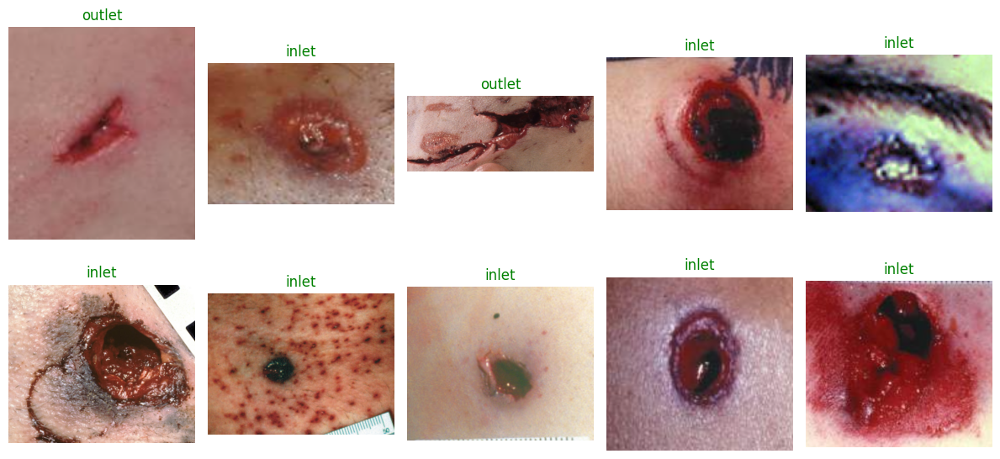

In [ ]:
display_image_grid(Sample_images_filepaths_train)

## **Define a PyTorch dataset class**

In [ ]:
class BulletDataset(Dataset):
    def __init__(self, images_filepaths, transform=None):
        self.images_filepaths = images_filepaths
        self.transform = transform


    def __len__(self):
        return len(self.images_filepaths)

    def __getitem__(self, idx):
        image_filepath = self.images_filepaths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if os.path.normpath(image_filepath).split(os.sep)[-2] == "inlet":
            label = 0.0

        else:     #          ----- >.   MoreThanSeventeenDays
            label = 1.0
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        return image, label

In [ ]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [ ]:
train_transform_Test = A.Compose([
               AdvancedHairAugmentation(hairs_folder='/content/gdrive/MyDrive/Bruise_datasets/hairs_folder'),
              DrawHair(),
              A.Resize(256, 256),
              A.RandomCrop(224, 224),
              A.HorizontalFlip(),
              A.Normalize(
                  mean=[0.485, 0.456, 0.406],
                  std=[0.229, 0.224, 0.225],
              ),
              ToTensorV2()
])
train_dataset = BulletDataset(images_filepaths=correct_images_filepaths_train, transform=train_transform_Test)

In [ ]:
train_dl_test = DataLoader(train_dataset, batch_size=16,
                                       shuffle=True, num_workers=2)

In [ ]:
len(train_dl_test)

20

In [ ]:
batch = next(iter(train_dl_test))
train_data_test = batch[0]
print(train_data_test.shape)

torch.Size([16, 3, 224, 224])


In [ ]:
import copy
def visualize_augmentations(dataset, idx=0, samples=10, cols=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    rows = samples // cols
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 6))
    for i in range(samples):
        image, _ = dataset[idx]
        ax.ravel()[i].imshow(image)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    plt.show()

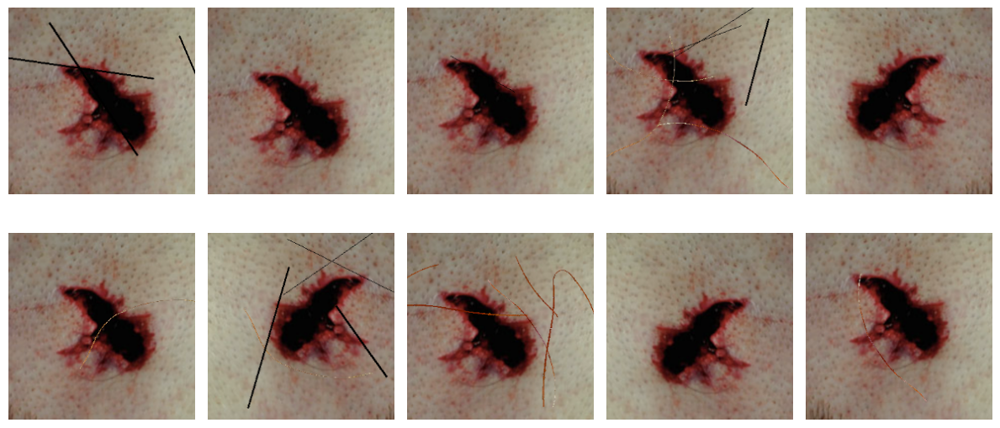

In [ ]:
# random.seed(80)
visualize_augmentations(train_dataset)

# Transforms

In [ ]:
from albumentations.augmentations.transforms import VerticalFlip
# from torchvision.models.alexnet import alexnet
# image size =  1000 * 1000
# image_size = 256
import albumentations as A
from albumentations.pytorch import ToTensorV2

transform_train = A.Compose([

         AdvancedHairAugmentation(hairs_folder='/content/gdrive/MyDrive/Bruise_datasets/hairs_folder'),
              DrawHair(),
              A.Resize(260, 260),
              A.RandomCrop(256, 256),
              A.Transpose(p=0.5),
              A.VerticalFlip(p =0.5),
              A.HorizontalFlip(p=0.5),
              A.RandomBrightness(limit=0.2, p=0.75),
              A.HorizontalFlip(p=0.5),
              A.RandomContrast(limit=0.2, p=0.75),
              A.OneOf([
                      A.MotionBlur(blur_limit=5),
                      A.MedianBlur(blur_limit=5),
                      # A.GaussianBlur(blur_limit=5),
                      A.GaussNoise(var_limit=(5.0, 30.0)),
        ], p=0.7),

        A.OneOf([
                      A.OpticalDistortion(distort_limit=1.0),
                      # A.GridDistortion(num_steps=5, distort_limit=1.),
                      # A.ElasticTransform(alpha=3.0),
        ], p=0.7),

        A.CLAHE(clip_limit=4.0, p=0.7),
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.5),
        # A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.85),

        # A.Cutout(max_h_size=int(256 * 0.375), max_w_size=int(256 * 0.375), num_holes=1, p=0.7),

              A.Normalize(
                  mean=[0.485, 0.456, 0.406],
                  std=[0.229, 0.224, 0.225],
              ),
              ToTensorV2()

                                ])

      # ToTensorV2(),
      # A.Resize(256, 256),

      # AdvancedHairAugmentation(hairs_folder='/content/gdrive/MyDrive/Bruise_datasets/hairs_folder'),
      # DrawHair(),
        # albumentations.Transpose(p=0.5),
        # albumentations.VerticalFlip(),
        # albumentations.HorizontalFlip(),
        # albumentations.RandomBrightness(limit=0.2, p=0.75),
        # albumentations.RandomContrast(limit=0.2, p=0.75),
        # albumentations.OneOf([
        #     albumentations.MotionBlur(blur_limit=5),
        #     albumentations.MedianBlur(blur_limit=5),
        #     # albumentations.GaussianBlur(blur_limit=5),
        #     albumentations.GaussNoise(var_limit=(5.0, 30.0)),
        # ], p=0.7),

        # albumentations.OneOf([
        #     albumentations.OpticalDistortion(distort_limit=1.0),
        #     albumentations.GridDistortion(num_steps=5, distort_limit=1.),
        #     albumentations.ElasticTransform(alpha=3.0),
        # ], p=0.7),

        # albumentations.CLAHE(clip_limit=4.0, p=0.7),
        # albumentations.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.5),
        # albumentations.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.85),

        # albumentations.Cutout(max_h_size=int(image_size * 0.375), max_w_size=int(image_size * 0.375), num_holes=1, p=0.7),
        # A.Normalize(
        #           mean=[0.485, 0.456, 0.406],
        #           std=[0.229, 0.224, 0.225],
        #       ),
        # albumentations.Resize(224, 224)

    # transforms.RandomCrop(32, padding=4),  # PIL Image
    # transforms.RandomHorizontalFlip(p=0.5),
    # transforms.RandomRotation(degrees=45),
    # transforms.Resize((224,224)),
    #  transforms.RandomHorizontalFlip() ,   # PIL Image
    # transforms.ToTensor(), #  # Tensor
    # transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    #  ])


transform_valid = A.Compose([

        A.Resize(256, 256),
        A.Normalize(
                  mean=[0.485, 0.456, 0.406],
                  std=[0.229, 0.224, 0.225],
              ) ,
        ToTensorV2() #     important :::: ToTensor should be the last op.

    # transforms.Resize((224,224)),
    # transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])


## **make customer dataset**

In [ ]:
# train_ds = datasets.ImageFolder(trn_dir, transform=transform_train)
# valid_ds = datasets.ImageFolder(val_dir, transform=transform_valid)
train_ds = BulletDataset(images_filepaths=correct_images_filepaths_train, transform=transform_train)
valid_ds = BulletDataset(images_filepaths=correct_images_filepaths_validation, transform=transform_valid)

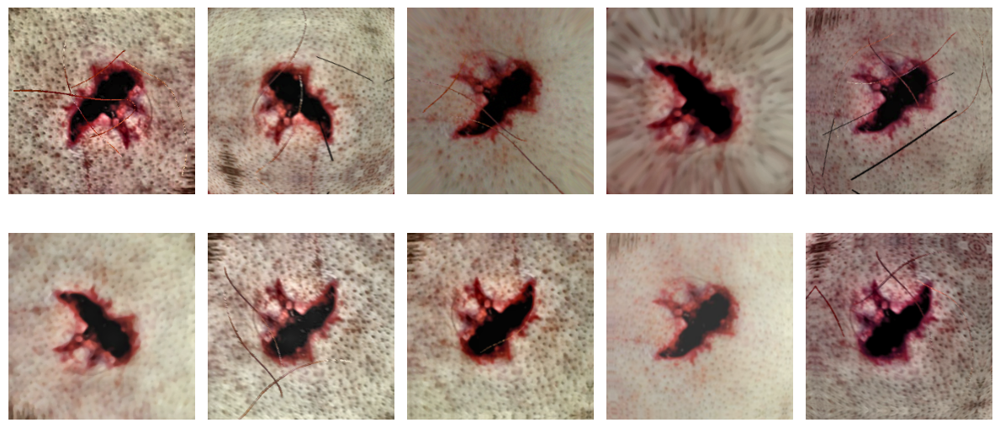

In [ ]:
visualize_augmentations(train_ds)

In [ ]:
len(train_ds), len(valid_ds)

(319, 182)

In [ ]:
from matplotlib import image
batch_size =16


train_dl = DataLoader(train_ds, batch_size=batch_size,
                                       shuffle=True, num_workers=2)
valid_dl = DataLoader(valid_ds, batch_size=batch_size,
                                       shuffle=True, num_workers=2)
print(len(train_dl))
print(len(train_ds)//batch_size)
print(len(valid_dl))
# samples = {'image':image, 'labels':labels}



20
19
12


In [ ]:
batch = next(iter(train_dl))
train_data = batch[0]
print(train_data.shape)

torch.Size([16, 3, 256, 256])


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

In [ ]:
batch = next(iter(train_dl))
train_data = batch[0]
len(batch[0])

16

In [ ]:
# classes = train_ds.classes
# print(classes)
# print(batch[1])

# plot_images(batch[0],batch[1], classes,normalize=True)

In [ ]:
!pip install timm

In [ ]:
import timm # PyTorch Image Models

In [ ]:
# net = timm.create_model('efficientnetv2_rw_s',pretrained=True) #load pretrained model
net = timm.create_model('tf_efficientnetv2_s_in21ft1k',pretrained=True)

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name tf_efficientnetv2_s_in21ft1k to current tf_efficientnetv2_s.in21k_ft_in1k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/86.5M [00:00<?, ?B/s]

In [ ]:
net.classifier

Linear(in_features=1280, out_features=1000, bias=True)

In [ ]:
# Updating the pretarined model:
# for param in net.parameters():
#     param.requires_grad=False

net.classifier = nn.Sequential(
    nn.Linear(in_features=1280, out_features=625), #1792 is the orginal in_features
    nn.ReLU(), #ReLu to be the activation function
    nn.Dropout(p=0.3),
    nn.Linear(in_features=625, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=2),
)

net = net.to(device)

In [ ]:
y = net(batch[0].to(device))

y.shape


torch.Size([16, 2])

In [ ]:
batch[1].shape

torch.Size([16])

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001,
                      momentum=0.9, weight_decay=5e-4)
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20000, eta_min=1e-6)

In [ ]:
batch[1] =batch[1].type(torch.LongTensor)
# label = label.type(torch.LongTensor)
criterion(y, batch[1].to(device))

tensor(0.6646, device='cuda:0', grad_fn=<NllLossBackward0>)

In [ ]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [ ]:
count_parameters(net)

21.138883

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [ ]:
# try:
#     from google import colab
#     COLAB_ENV = True
# except (ImportError, ModuleNotFoundError):
#     COLAB_ENV = False
COLAB_ENV = True
# Load the TensorBoard notebook extension
if COLAB_ENV:
#     %load_ext tensorboard
    %reload_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

<IPython.core.display.Javascript object>

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 8.8 MB/s eta 0:00:00


In [ ]:
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger()

In [ ]:
logging.info('This is an info message')
logging.warning('This is a warning message')
logging.error('This is an error message')
logging.critical('This is a critical message')

INFO:root:This is an info message
ERROR:root:This is an error message
CRITICAL:root:This is a critical message


In [ ]:
import time

In [ ]:
import sys
import torchmetrics
import logging
logger = logging.getLogger('dataset')
# writer = SummaryWriter('runs/cifar100_resnet18')
writer = SummaryWriter()

In [ ]:
dataloaders ={'train':train_dl,'valid':valid_dl}


In [ ]:
def save_ckp(state, is_best, checkpoint_path, best_model_path):


    f_path = checkpoint_path
    # save checkpoint data to the path given, checkpoint_path
    torch.save(state, f_path)
    # if it is a best model, min validation loss
    if is_best:
        best_fpath = best_model_path
        # copy that checkpoint file to best path given, best_model_path
        shutil.copyfile(f_path, best_fpath)

In [ ]:
def load_ckp(checkpoint_fpath, model, optimizer):
    # load check point
    # if torch.cuda.is_available() == False:

    #   checkpoint = torch.load(checkpoint_fpath,map_location ='cpu')
    # else:
    checkpoint = torch.load(checkpoint_fpath)

    # initialize state_dict from checkpoint to model--->checkpoint = { 'state_dict': model.state_dict() }
    # model.load_state_dict(torch.load('model_weights.pth'))
    model.load_state_dict(checkpoint['state_dict']) # --> model.load_state_dict(model.state_dict())
    # initialize optimizer from checkpoint to optimizer--->checkpoint = { 'optimizer': optimizer.state_dict()}
    optimizer.load_state_dict(checkpoint['optimizer'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    valid_loss_min = checkpoint['valid_loss_min']
    acc = checkpoint['acc']
    # return model, optimizer, epoch value, min validation loss
    return model, optimizer, checkpoint['epoch'], valid_loss_min.item(),checkpoint['acc']

In [ ]:
use_cuda = torch.cuda.is_available()

In [ ]:
from torchmetrics import Accuracy
from torchmetrics import Precision
def train(start_epoch,end_epoch,valid_loss_min_input, loaders, model, optimizer, criterion, use_cuda, checkpoint_path, best_model_path):
    valid_loss_min= valid_loss_min_input
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    use_cuda = torch.cuda.is_available()
    losses = []

    for epoch in range(start_epoch,end_epoch):
      # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        ###################
        # train the model #
        ###################
        model.train()
        loss_total_train = AverageMeter()
        accuracy_train = torchmetrics.Accuracy(task='multiclass',num_classes=2).cuda()
        # precision_train = torchmetrics.Precision(average='macro', num_classes=7).cuda()

        for batch_idx, (inputs, targets) in enumerate(train_dl):
          #move to GPU:
            if use_cuda:
                targets = targets.type(torch.LongTensor)
                inputs, targets = inputs.cuda(), targets.cuda()
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            loss_total_train.update(loss)
            accuracy_train(outputs.softmax(dim=-1), targets)
            # precision_train(outputs.softmax(dim=-1), targets)
          # print(targets[:10])
           # if batch_idx == 30:
          #    break
            # scheduler.step()

        acc_train = accuracy_train.compute()
        # pre_train = precision_train.compute()
        writer.add_scalar('Loss/train', loss_total_train.avg.item(), epoch)
        writer.add_scalar('Acc/train', acc_train.item(), epoch)
        print(f'Train: Epoch:{epoch} Loss:{loss_total_train.avg:.4} Accuracy:{acc_train:.4} ')
        ######################
        # validate the model #
        ######################
        model.eval()
        loss_total_valid = AverageMeter()
        accuracy_valid = torchmetrics.Accuracy(task='multiclass',num_classes=2).cuda()
        # precision_valid = torchmetrics.Precision(average='macro', num_classes=7).cuda()
        with torch.no_grad():
            for batch_idx, (inputs, targets) in enumerate(valid_dl):
                targets = targets.type(torch.LongTensor)
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                loss_total_valid.update(loss)
                accuracy_valid(outputs.softmax(dim=-1), targets)
                # precision_valid(outputs.softmax(dim=-1), targets)
            acc_valid = accuracy_valid.compute()
            # pre_valid = precision_valid.compute()
            writer.add_scalar('Loss/test', loss_total_valid.avg.item(), epoch)
            writer.add_scalar('Acc/test', acc_valid.item(), epoch)
            print(f'Test:  Epoch:{epoch} Loss:{loss_total_valid.avg:.4} Accuracy:{acc_valid:.4} ')
            print()
      # Save checkpoint

        checkpoint = {
            'epoch': epoch + 1,
              'valid_loss_min': loss_total_valid.avg,
              'state_dict': model.state_dict(), # --> Model Weights
              'optimizer': optimizer.state_dict(),
              'acc':acc_valid ,
            }
          # make   checkpoint_path
        # checkpoint_path = '/content/challenge/checkpoint/'
        # if not os.path.exists(checkpoint_path):
        #     os.makedirs(checkpoint_path)
        # else:
        #   pass
        # best_model_path = '/content/challenge/best_model/'
        # if not os.path.exists(best_model_path):
        #     os.makedirs(best_model_path)
        # else:
        #   pass
          # save checkpoint

        save_ckp(checkpoint, False, checkpoint_path, best_model_path)

        ## TODO: save the model if validation loss has decreased
        if loss_total_valid.avg <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,loss_total_valid.avg))
            # save checkpoint as best model
            save_ckp(checkpoint, True, checkpoint_path, best_model_path)
            valid_loss_min = loss_total_valid.avg

    # return trained model
    return model, losses

In [ ]:
trained_model = train(1,100, np.Inf, dataloaders, net, optimizer, criterion, use_cuda, "/content/gdrive/MyDrive/bullet/tf/current_checkpoint.pt", "/content/gdrive/MyDrive/bullet/tf/best_model.pt")

Train: Epoch:1 Loss:0.6416 Accuracy:0.7085 
Test:  Epoch:1 Loss:0.6821 Accuracy:0.5934 

Validation loss decreased (inf --> 0.682136).  Saving model ...
Train: Epoch:2 Loss:0.5716 Accuracy:0.7492 
Test:  Epoch:2 Loss:0.7347 Accuracy:0.5934 

Train: Epoch:3 Loss:0.5557 Accuracy:0.7492 
Test:  Epoch:3 Loss:0.7292 Accuracy:0.5934 

Train: Epoch:4 Loss:0.5461 Accuracy:0.7492 
Test:  Epoch:4 Loss:0.7297 Accuracy:0.5934 

Train: Epoch:5 Loss:0.5275 Accuracy:0.7492 
Test:  Epoch:5 Loss:0.7097 Accuracy:0.5934 

Train: Epoch:6 Loss:0.5193 Accuracy:0.7492 
Test:  Epoch:6 Loss:0.7337 Accuracy:0.5934 

Train: Epoch:7 Loss:0.5099 Accuracy:0.7492 
Test:  Epoch:7 Loss:0.7319 Accuracy:0.5934 

Train: Epoch:8 Loss:0.5043 Accuracy:0.7492 
Test:  Epoch:8 Loss:0.7509 Accuracy:0.5934 

Train: Epoch:9 Loss:0.4862 Accuracy:0.7492 
Test:  Epoch:9 Loss:0.7317 Accuracy:0.5934 

Train: Epoch:10 Loss:0.491 Accuracy:0.7524 
Test:  Epoch:10 Loss:0.7148 Accuracy:0.5934 

Train: Epoch:11 Loss:0.4538 Accuracy:0.7492 


In [ ]:

ckp_path = '/content/gdrive/MyDrive/Bruise_datasets/tf_efficientnetv2_s/current_checkpoint.pt'
# model, optimizer, checkpoint['epoch'], valid_loss_min.item(),checkpoint['acc']
net, optimizer, start_epoch, valid_loss_min,accuracy_valid = load_ckp(ckp_path, net, optimizer)

In [ ]:
# print("model = ", net)
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
# print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))
print("accuracy_valid = {:.4f}".format(accuracy_valid))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  200
valid_loss_min = 0.155453
accuracy_valid = 0.9628


In [ ]:
trained_model = train(start_epoch, 300, valid_loss_min, dataloaders, net, optimizer, criterion, use_cuda, "/content/gdrive/MyDrive/Bruise_datasets/tf_efficientnetv2_s/current_checkpoint.pt", "/content/gdrive/MyDrive/Bruise_datasets/tf_efficientnetv2_s/best_model.pt")

Train: Epoch:200 Loss:0.1066 Accuracy:0.9655 
Test:  Epoch:200 Loss:0.1925 Accuracy:0.9674 

Train: Epoch:201 Loss:0.1334 Accuracy:0.955 
Test:  Epoch:201 Loss:0.263 Accuracy:0.9628 

Train: Epoch:202 Loss:0.1302 Accuracy:0.9579 
Test:  Epoch:202 Loss:0.1803 Accuracy:0.9535 

Train: Epoch:203 Loss:0.1157 Accuracy:0.9603 
Test:  Epoch:203 Loss:0.264 Accuracy:0.9721 

Train: Epoch:204 Loss:0.1212 Accuracy:0.9609 
Test:  Epoch:204 Loss:0.1876 Accuracy:0.9767 

Train: Epoch:205 Loss:0.1252 Accuracy:0.9609 
Test:  Epoch:205 Loss:0.2121 Accuracy:0.9628 

Train: Epoch:206 Loss:0.0983 Accuracy:0.9667 
Test:  Epoch:206 Loss:0.1656 Accuracy:0.9721 

Train: Epoch:207 Loss:0.1168 Accuracy:0.9609 
Test:  Epoch:207 Loss:0.1788 Accuracy:0.9674 

Train: Epoch:208 Loss:0.1289 Accuracy:0.955 
Test:  Epoch:208 Loss:0.1776 Accuracy:0.9674 

Train: Epoch:209 Loss:0.1039 Accuracy:0.9661 
Test:  Epoch:209 Loss:0.1506 Accuracy:0.9721 

Validation loss decreased (0.155453 --> 0.150643).  Saving model ...
Train

In [ ]:
ckp_path = '/content/gdrive/MyDrive/Bruise_datasets/tf_efficientnetv2_s_in21ft1k/best_model.pt'
# model, optimizer, checkpoint['epoch'], valid_loss_min.item(),checkpoint['acc']
net, optimizer, start_epoch, valid_loss_min,accuracy_valid = load_ckp(ckp_path, net, optimizer)

In [ ]:
# print("model = ", net)
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
# print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))
print("accuracy_valid = {:.4f}".format(accuracy_valid))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  228
valid_loss_min = 0.121668
accuracy_valid = 0.9767


In [ ]:
!pip install torchmetrics

In [ ]:
import torchmetrics

In [ ]:

def evaluate_model(model, dataloader):
    model.eval()  # for batch normalization layers
    corrects = 0
    accuracy_val = torchmetrics.Accuracy().cuda()
    # precision_val = torchmetrics.Precision(average='macro', num_classes=7).cuda()
    # recall_val = torchmetrics.Recall(average='macro', num_classes=7).cuda()
    # confmat = torchmetrics.ConfusionMatrix(num_classes=7).cuda()
    for inputs, targets in dataloader:
#         inputs, targets = to_var(inputs, True), to_var(targets, True)
        targets = targets.type(torch.LongTensor)
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
#         print(outputs)
        _, preds = torch.max(outputs.data, 1)

        accuracy_val(outputs.softmax(dim=-1), targets)
        # precision_val(outputs.softmax(dim=-1), targets)
        # recall_val(outputs.softmax(dim=-1), targets)
        # confmat(outputs.softmax(dim=-1), targets)

        # print(preds)
        # print(targets.data)
        # print(precision(preds, targets.data))

        # print('#####################')
        corrects += (preds == targets.data).sum()
        # print(corrects)
        # print('#####################')
    acc_valid = accuracy_val.compute()
    # pre_valid = precision_val.compute()
    # rec_valid = recall_val.compute()
    # confmat_valid = confmat.compute()
    print('Accuracy by torchmetrics: {:.2f}'.format(acc_valid.item()))
    # print('Precision by torchmetrics: {:.2f}'.format(pre_valid.item()))
    # print('Recall  by torchmetrics: {:.2f}'.format(rec_valid.item()))
    # print([t.numpy() for t in confmat_valid])
    print('accuracy: {:.2f}'.format(100. * corrects / len(dataloader.dataset)))

In [ ]:
evaluate_model(net, valid_dl)

Accuracy by torchmetrics: 0.98
accuracy: 97.67


In [ ]:
# print(len(test_dl))
# print(len(test_ds))
# print(len(valid_ds))

In [ ]:
# evaluate_model(net, test_dl)

In [ ]:
print(len(train_dl))

107



## Step 4. Model evaluation

In [ ]:
import itertools

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
from torch.autograd import Variable
from sklearn.metrics import confusion_matrix

In [ ]:
# classes = valid_ds.classes
# print(classes)

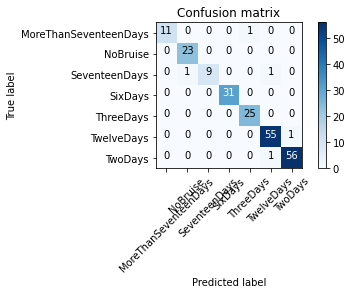

In [ ]:
net.eval()
y_label = []
y_predict = []
with torch.no_grad():
    for i, data in enumerate(valid_dl):
        images, labels = data
        N = images.size(0)
        images = Variable(images).to(device)
        outputs = net(images)
        prediction = outputs.max(1, keepdim=True)[1]
        y_label.extend(labels.cpu().numpy())
        y_predict.extend(np.squeeze(prediction.cpu().numpy().T))

# compute the confusion matrix
confusion_mtx = confusion_matrix(y_label, y_predict)
# plot the confusion matrix
plot_labels = ['MoreThanSeventeenDays', 'NoBruise', 'SeventeenDays', 'SixDays', 'ThreeDays', 'TwelveDays', 'TwoDays']
plot_confusion_matrix(confusion_mtx, plot_labels)

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
report = classification_report(y_label, y_predict, target_names=plot_labels)
print(report)

                       precision    recall  f1-score   support

MoreThanSeventeenDays       1.00      0.92      0.96        12
             NoBruise       0.96      1.00      0.98        23
        SeventeenDays       1.00      0.82      0.90        11
              SixDays       1.00      1.00      1.00        31
            ThreeDays       0.96      1.00      0.98        25
           TwelveDays       0.96      0.98      0.97        56
              TwoDays       0.98      0.98      0.98        57

             accuracy                           0.98       215
            macro avg       0.98      0.96      0.97       215
         weighted avg       0.98      0.98      0.98       215



Text(0, 0.5, 'Fraction classified incorrectly')

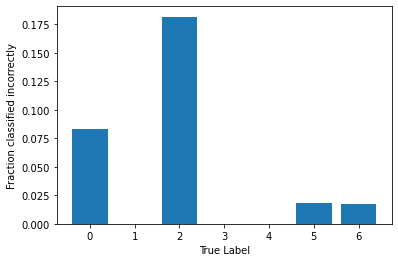

In [ ]:
label_frac_error = 1 - np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
plt.bar(np.arange(7),label_frac_error)
plt.xlabel('True Label')
plt.ylabel('Fraction classified incorrectly')

New evalution Methods

In [ ]:
import itertools
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
classes =['NoBruise', 'TwoDays','ThreeDays','SixDays','SeventeenDays', 'TwelveDays','MoreThanSeventeenDays']
device = 'cuda' if torch.cuda.is_available() else 'cpu'

def imshow(inp, title=None):
    """Imshow for Tensor.
    """
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.axis('off')
    if title is not None:
        plt.title(title)


def visualize_model(model, dataloader, device, num_images=10):
    """ Visulaize the prediction of the model on a bunch of random data.
    """
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(10., 8.))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs.data, 1)
            print(preds)
            print(labels)
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('label: {} predicted: {}'.format(labels[j],preds[j]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    return

def plot_errors(model, dataloader, device):
    model.eval()
    plt.figure(figsize=(12, 24))
    count = 0

    with torch.no_grad():
        for inputs, labels in tqdm(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            incorrect_idxs = np.flatnonzero(preds.cpu().numpy() != labels.cpu().numpy())

            for idx in incorrect_idxs:
                count += 1
                if count > 30: break
                ax = plt.subplot(10, 3, count)
                ax.axis('off')
                ax.set_title('predicted: {}'.format([preds[idx]]))
                imshow(inputs.cpu().data[idx])

    plt.show()

    print("{} images out of {} were misclassified.".format(count, len(dataloader.dataset)))


In [ ]:
# classes = valid_ds
# print(classes)
# classes = train_ds.classes
# print(classes)

tensor([6, 4, 1, 5, 6, 6, 1, 1, 6, 0, 1, 5, 4, 0, 4, 6], device='cuda:0')
tensor([6., 4., 1., 5., 6., 6., 1., 1., 6., 0., 1., 5., 4., 0., 4., 6.],
       device='cuda:0', dtype=torch.float64)


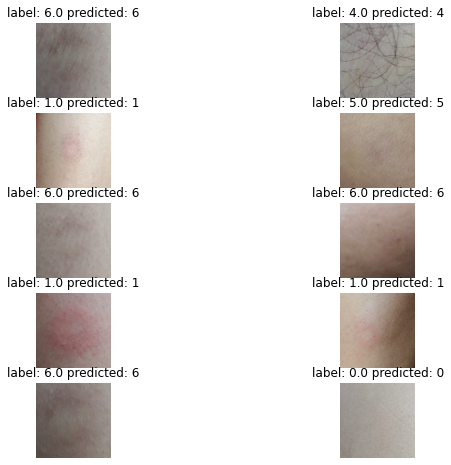

In [ ]:
visualize_model(net, valid_dl,device)

100%|██████████| 14/14 [00:03<00:00,  3.60it/s]


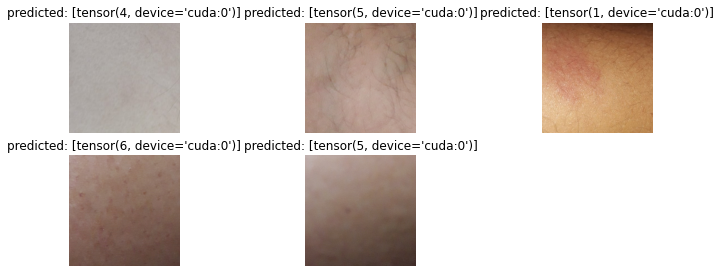

5 images out of 215 were misclassified.


In [ ]:
plot_errors(net, valid_dl,device)

In [ ]:
# classes = train_ds.classes
# print(classes)
# val_dir = '/content/data'

## **Self-distillation**

In [ ]:
# from torchvision import models
# student = models.mobilenet_v2(pretrained=True) # ---net : student
# student.fc = nn.Linear(1280,7)
# student =student.to(device)
# student


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.0001,
                      momentum=0.9, weight_decay=5e-4)

In [ ]:
# ckp_path = "/content/gdrive/MyDrive/Bruise_datasets/best_model/best_model.pt"
# ckp_path = "/content/gdrive/MyDrive/Bruise_datasets/checkpoint/current_checkpoint.pt"
ckp_path = '/content/gdrive/MyDrive/Bruise_datasets/tf_efficientnetv2_s_in21ft1k/best_model.pt'
teacher, optimizer, start_epoch, valid_loss_min,accuracy_value = load_ckp(ckp_path, net, optimizer)

In [ ]:
# print("model = ", net)
print("optimizer = ", optimizer)
print("start_epoch = ", start_epoch)
# print("valid_loss_min = ", valid_loss_min)
print("valid_loss_min = {:.6f}".format(valid_loss_min))
print("accuracy_valid = {:.4f}".format(accuracy_valid))

optimizer =  SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)
start_epoch =  228
valid_loss_min = 0.121668
accuracy_valid = 0.9767


In [ ]:
def loss_fn_kd(outputs, labels, teacher_outputs, alpha, T):
    """
    Compute the knowledge-distillation (KD) loss given outputs, labels.
    "Hyperparameters": temperature and alpha
    NOTE: the KL Divergence for PyTorch comparing the softmaxs of teacher
    and student expects the input tensor to be log probabilities! See Issue #2
    """
    KD_loss = nn.KLDivLoss()(F.log_softmax(outputs/T, dim=1),
                             F.softmax(teacher_outputs/T, dim=1)) * (alpha * T * T) + \
              F.cross_entropy(outputs, labels) * (1. - alpha)

    return KD_loss

In [ ]:
from torchmetrics import Accuracy
from torchmetrics import Precision
def train_st(start_epoch,end_epoch,valid_loss_min_input, loaders, student_model,teacher_model, optimizer, criterion, use_cuda, checkpoint_path, best_model_path):
    valid_loss_min= valid_loss_min_input
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    use_cuda = torch.cuda.is_available()
    losses = []

    for epoch in range(start_epoch,end_epoch):
      # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        ###################
        # train the model #
        ###################
        student_model.train()
        loss_total_train = AverageMeter()
        accuracy_train = torchmetrics.Accuracy().cuda()
        # precision_train = torchmetrics.Precision(average='macro', num_classes=7).cuda()

        for batch_idx, (inputs, targets) in enumerate(train_dl):
          #move to GPU:
            if use_cuda:
                inputs, targets = inputs.cuda(), targets.cuda()
            targets = targets.type(torch.LongTensor)
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = student_model(inputs)
            with torch.no_grad():
              outputs2 = teacher_model(inputs)
            loss = loss_fn_kd(outputs, targets, outputs2, 0.6, 5)
            # loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            loss_total_train.update(loss)
            accuracy_train(outputs.softmax(dim=-1), targets)
            # precision_train(outputs.softmax(dim=-1), targets)
          # print(targets[:10])
           # if batch_idx == 30:
          #    break
            # scheduler.step()

        acc_train = accuracy_train.compute()
        # pre_train = precision_train.compute()
        writer.add_scalar('Loss/train', loss_total_train.avg.item(), epoch)
        writer.add_scalar('Acc/train', acc_train.item(), epoch)
        print(f'Train: Epoch:{epoch} Loss:{loss_total_train.avg:.4} Accuracy:{acc_train:.4} ')
        ######################
        # validate the model #
        ######################
        student_model.eval()
        loss_total_valid = AverageMeter()
        accuracy_valid = torchmetrics.Accuracy().cuda()
        # precision_valid = torchmetrics.Precision(average='macro', num_classes=7).cuda()
        with torch.no_grad():
            for batch_idx, (inputs, targets) in enumerate(valid_dl):
                targets = targets.type(torch.LongTensor)
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = student_model(inputs)
                loss = criterion(outputs, targets)
                loss_total_valid.update(loss)
                accuracy_valid(outputs.softmax(dim=-1), targets)
                # precision_valid(outputs.softmax(dim=-1), targets)
            acc_valid = accuracy_valid.compute()
            # pre_valid = precision_valid.compute()
            writer.add_scalar('Loss/test', loss_total_valid.avg.item(), epoch)
            writer.add_scalar('Acc/test', acc_valid.item(), epoch)
            print(f'Test:  Epoch:{epoch} Loss:{loss_total_valid.avg:.4} Accuracy:{acc_valid:.4} ')
            print()
      # Save checkpoint

        checkpoint = {
            'epoch': epoch + 1,
              'valid_loss_min': loss_total_valid.avg,
              'state_dict': student_model.state_dict(), # --> Model Weights
              'optimizer': optimizer.state_dict(),
              'acc': acc_valid,
            }

        save_ckp(checkpoint, False, checkpoint_path, best_model_path)

        ## TODO: save the model if validation loss has decreased
        if loss_total_valid.avg <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,loss_total_valid.avg))
            # save checkpoint as best model
            save_ckp(checkpoint, True, checkpoint_path, best_model_path)
            valid_loss_min = loss_total_valid.avg

    # return trained model
    return student_model, losses

In [ ]:
trained_model = train_st(1,20,np.Inf,dataloaders,teacher,teacher, optimizer, criterion, use_cuda, "/content/gdrive/MyDrive/Bruise_datasets/check_st/current_checkpoint_st.pt", "/content/gdrive/MyDrive/Bruise_datasets/check_st/best_st.pt")

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:2887: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  "reduction: 'mean' divides the total loss by both the batch size and the support size."


Train: Epoch:1 Loss:0.05638 Accuracy:0.9661 
Test:  Epoch:1 Loss:0.1984 Accuracy:0.9674 

Validation loss decreased (inf --> 0.198392).  Saving model ...
Train: Epoch:2 Loss:0.05092 Accuracy:0.9725 
Test:  Epoch:2 Loss:0.1473 Accuracy:0.9674 

Validation loss decreased (0.198392 --> 0.147337).  Saving model ...
Train: Epoch:3 Loss:0.05222 Accuracy:0.972 
Test:  Epoch:3 Loss:0.1549 Accuracy:0.9721 

Train: Epoch:4 Loss:0.0487 Accuracy:0.9766 
Test:  Epoch:4 Loss:0.2195 Accuracy:0.9767 

Train: Epoch:5 Loss:0.05441 Accuracy:0.9696 
Test:  Epoch:5 Loss:0.1604 Accuracy:0.9674 

Train: Epoch:6 Loss:0.05064 Accuracy:0.9743 
Test:  Epoch:6 Loss:0.1377 Accuracy:0.9767 

Validation loss decreased (0.147337 --> 0.137744).  Saving model ...
Train: Epoch:7 Loss:0.04838 Accuracy:0.9755 
Test:  Epoch:7 Loss:0.1422 Accuracy:0.9674 

Train: Epoch:8 Loss:0.0463 Accuracy:0.9737 
Test:  Epoch:8 Loss:0.1487 Accuracy:0.9721 

Train: Epoch:9 Loss:0.05042 Accuracy:0.9743 
Test:  Epoch:9 Loss:0.1297 Accuracy:

### **Section 4: Ensemble Models¶**